##### Case iFood
Essa base de dados é proveniente da empresa iFood, utilizada em uma processo seletivo já encerrado do ano de 2020.

In [1]:
# imporrtações
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import tabulate
from tabulate import tabulate

In [2]:
# verificando as versões das bibliotecas utilizadas

def get_library_versions():
    libraries = ['pandas', 'numpy', 'matplotlib', 'seaborn', ]

    versions = []
    for lib in libraries:
        try:
            version = __import__(lib).__version__
            versions.append([lib, version])
        except ImportError:
            versions.append([lib, 'Não encontrado'])

    # Adiciona a versão do Python
    versions.append(['python', f'{sys.version_info.major}.{sys.version_info.minor}.{sys.version_info.micro}'])

    return versions

if __name__ == "__main__":
    versions = get_library_versions()

    # Imprime as versões como uma tabela
    headers = ['Biblioteca', 'Versão']
    print(tabulate(versions, headers, tablefmt='fancy_grid'))

╒══════════════╤══════════╕
│ Biblioteca   │ Versão   │
╞══════════════╪══════════╡
│ pandas       │ 1.5.3    │
├──────────────┼──────────┤
│ numpy        │ 1.24.3   │
├──────────────┼──────────┤
│ matplotlib   │ 3.7.1    │
├──────────────┼──────────┤
│ seaborn      │ 0.12.2   │
├──────────────┼──────────┤
│ python       │ 3.11.4   │
╘══════════════╧══════════╛


In [3]:
df = pd.read_csv(r'c:/Users/carol/Downloads/ml_project1_data.csv')

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0


In [4]:
df.shape

(2240, 29)

In [5]:
# verificando o tipo dos dados
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [6]:
# verificando se há dados nulos
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [7]:
# verificando se há dados em duplicidade
df.duplicated().sum()

0

In [8]:
with pd.option_context (
    'display.float_format','{:.2f}'.format,
    'display.max_columns', None,
):
    display(df.describe())

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.00,2240.00,2216.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00
mean,5592.16,1968.81,52247.25,0.44,0.51,49.11,303.94,26.30,166.95,37.53,27.06,44.02,2.33,4.08,2.66,5.79,5.32,0.07,0.07,0.07,0.06,0.01,0.01,3.00,11.00,0.15
std,3246.66,11.98,25173.08,0.54,0.54,28.96,336.60,39.77,225.72,54.63,41.28,52.17,1.93,2.78,2.92,3.25,2.43,0.26,0.26,0.26,0.25,0.11,0.10,0.00,0.00,0.36
min,0.00,1893.00,1730.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
25%,2828.25,1959.00,35303.00,0.00,0.00,24.00,23.75,1.00,16.00,3.00,1.00,9.00,1.00,2.00,0.00,3.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
50%,5458.50,1970.00,51381.50,0.00,0.00,49.00,173.50,8.00,67.00,12.00,8.00,24.00,2.00,4.00,2.00,5.00,6.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
75%,8427.75,1977.00,68522.00,1.00,1.00,74.00,504.25,33.00,232.00,50.00,33.00,56.00,3.00,6.00,4.00,8.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
max,11191.00,1996.00,666666.00,2.00,2.00,99.00,1493.00,199.00,1725.00,259.00,263.00,362.00,15.00,27.00,28.00,13.00,20.00,1.00,1.00,1.00,1.00,1.00,1.00,3.00,11.00,1.00


In [9]:
# visualizando as colunas não numéricas
df.describe(exclude = 'number')

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,2012-08-31
freq,1127,864,12


In [10]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

A partir do Profile Report foi possível inferir algumas das características da base de dados e a maneira como as features estão divididas:
- visualização de dados nulos e duplicados
- tipos de variáveis
- na coluna 'year_birth' é possível observar que o valor mínimo é de 1893, sendo necessário avaliar melhor para entender se esse foi um possível erro de digitação ou inserção do dado
- coluna 'education' traz as informações sobre escolaridade encontradas nesse grupo
- 'marital_status' é a coluna sobre a situação civil da pessoa e pudemos observar que aqui é possível realizar um agrupamento tendo em vista que há 8 categorias
- em 'income' temos o valor máximo como '666666' sendo necessário entender se esse valor é real ou erro de inserção
- colunas 'kidhome' e 'teenhome' diz sobre a presença de crianças ou adolescentes em casa e também é uma coluna que pode ser agrupada

Com essa ferramenta, é possível verificar varios fatores da base de dados de maneira clara e objetiva, ainda que precisemos olhar cada uma com mais atenção, o Profile Report nos dá uma boa visão da base de dados.

In [11]:
# remoção de linhas que possuem ao menos um valor ausente
#tendo em vista que esses valores representam menos de 1% do dataset
df = df.dropna()

# alterando o formato da data
df.loc[:, 'Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%Y-%m-%d')

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2216 non-null   int64         
 1   Year_Birth           2216 non-null   int64         
 2   Education            2216 non-null   object        
 3   Marital_Status       2216 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2216 non-null   int64         
 6   Teenhome             2216 non-null   int64         
 7   Dt_Customer          2216 non-null   datetime64[ns]
 8   Recency              2216 non-null   int64         
 9   MntWines             2216 non-null   int64         
 10  MntFruits            2216 non-null   int64         
 11  MntMeatProducts      2216 non-null   int64         
 12  MntFishProducts      2216 non-null   int64         
 13  MntSweetProducts     2216 non-nul

In [13]:
# describe da coluna 'Dt_customer'
df["Dt_Customer"].describe(datetime_is_numeric=True)

count                             2216
mean     2013-07-10 11:29:27.509025280
min                2012-07-30 00:00:00
25%                2013-01-16 00:00:00
50%                2013-07-08 12:00:00
75%                2013-12-31 00:00:00
max                2014-06-29 00:00:00
Name: Dt_Customer, dtype: object

Verificamos o período de ínicio do dataset e o fim, que engloba um período de dois anos

In [14]:
# criação de nova coluna para ver há quantos dias o cliente está cadastrado
df['DaysSinceEnrolled'] = df['Dt_Customer'].max() - df['Dt_Customer']
df['DaysSinceEnrolled'] = df['DaysSinceEnrolled'].dt.days

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,0,3,11,1,663
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,0,3,11,0,113
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,0,3,11,0,312


In [15]:
# transformando a informação anterior para ano
df["YearsSinceEnrolled"] = df["DaysSinceEnrolled"] // 365
df.head(3)


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,3,11,1,663,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,3,11,0,113,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,3,11,0,312,0


In [16]:
df['YearsSinceEnrolled'].value_counts()

0    1144
1    1072
Name: YearsSinceEnrolled, dtype: int64

In [17]:
# criando uma coluna para a idade
df['Age'] = df['Dt_Customer'].max().year - df['Year_Birth']
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,3,11,1,663,1,57
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,3,11,0,113,0,60
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,3,11,0,312,0,49


In [18]:
df.Age.describe()

count    2216.000000
mean       45.179603
std        11.985554
min        18.000000
25%        37.000000
50%        44.000000
75%        55.000000
max       121.000000
Name: Age, dtype: float64

Verificamos que há uma idade que provavelmente não é real

##### Iremos realizar uma segregação das idades por grupo
- jovem-adulto:18-30
- adulto: 31-45
- adulto_senior: 46-60
- idoso: 61+

In [19]:
df['AgeGroup'] = pd.cut(
    df['Age'],
    bins=[18,30,45,60, df['Age'].max()],
    labels=['18-30','31-45','46-60','61+'],
    include_lowest = True,
)

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,3,11,1,663,1,57,46-60
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,3,11,0,113,0,60,46-60
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,3,11,0,312,0,49,46-60


In [20]:
df.tail(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,0,0,0,3,11,0,155,0,33,31-45
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,0,0,3,11,0,156,0,58,46-60
2239,9405,1954,PhD,Married,52869.0,1,1,2012-10-15,40,84,...,0,0,0,3,11,1,622,1,60,46-60


In [21]:
# verificando os maiores de 100 anos
df[['Age','AgeGroup']][df['Age']>100].head()

,Age,AgeGroup
192,114,61+
239,121,61+
339,115,61+


In [22]:
df['AgeGroup'].value_counts()

31-45    965
46-60    727
61+      267
18-30    257
Name: AgeGroup, dtype: int64

In [23]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'DaysSinceEnrolled', 'YearsSinceEnrolled', 'Age', 'AgeGroup'],
      dtype='object')

In [24]:
# colunas 'Mnt' se referem ao valor gasto em certos produtos
df.columns.str.startswith('Mnt')

array([False, False, False, False, False, False, False, False, False,
        True,  True,  True,  True,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [25]:
df.columns[df.columns.str.startswith("Mnt")]


Index(['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds'],
      dtype='object')

In [26]:
df.loc[:, df.columns.str.startswith("Mnt")]
# explicar sobre as colunas gold e regulares

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
0,635,88,546,172,88,88
1,11,1,6,2,1,6
2,426,49,127,111,21,42
3,11,4,20,10,3,5
4,173,43,118,46,27,15
...,...,...,...,...,...,...
2235,709,43,182,42,118,247
2236,406,0,30,0,0,8
2237,908,48,217,32,12,24
2238,428,30,214,80,30,61


In [27]:
# criando duas colunas de gasto, dividido em gastos com todos os produtos e produtors regulares

df["MntTotal"] = (
    df["MntWines"]
    + df["MntFruits"]
    + df["MntMeatProducts"]
    + df["MntFishProducts"]
    + df["MntSweetProducts"]
    + df["MntGoldProds"]
)

df["MntRegularProds"] = df["MntTotal"] - df["MntGoldProds"]

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,663,1,57,46-60,1617,1529
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,113,0,60,46-60,27,21
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,312,0,49,46-60,776,734


In [28]:
df.tail(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,0,3,11,0,155,0,33,31-45,1241,1217
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,3,11,0,156,0,58,46-60,843,782
2239,9405,1954,PhD,Married,52869.0,1,1,2012-10-15,40,84,...,0,3,11,1,622,1,60,46-60,172,151


In [29]:
# união das colunas 'kidhome' e 'teenhome'

df['Children'] = df['Kidhome'] + df['Teenhome']

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,3,11,1,663,1,57,46-60,1617,1529,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,3,11,0,113,0,60,46-60,27,21,2
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,3,11,0,312,0,49,46-60,776,734,0


In [30]:
# aplicando lambda para criação de coluna 'HasChildren' - coluna flag (sim ou não)
df["HasChildren"] = df["Children"].apply(lambda x: 1 if x > 0 else 0)
df.head()

# 0 quando não há filho
# 1 quando há filho

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,11,1,663,1,57,46-60,1617,1529,0,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,11,0,113,0,60,46-60,27,21,2,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,11,0,312,0,49,46-60,776,734,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,11,0,139,0,30,18-30,53,48,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,11,0,161,0,33,31-45,422,407,1,1


In [31]:
df["HasChildren"].value_counts()


1    1583
0     633
Name: HasChildren, dtype: int64

In [32]:
# para a coluna 'marital_status' iremos dividir em apenas duas features

df["Marital_Status"] = df["Marital_Status"].replace(
    {
        "Alone": "Single",
        "Absurd": "Single",
        "YOLO": "Single",
        "Together": "Partner",
        "Married": "Partner",
        "Widow": "Single",
        "Single": "Single",
        "Divorced": "Single",
    }
)


In [33]:
df['Marital_Status'].value_counts()

Partner    1430
Single      786
Name: Marital_Status, dtype: int64

Alguns links para ajudar a entender a divisão de 'Education'
- https://en.wikipedia.org/wiki/Educational_stage
- https://www.studyinternational.com/news/university-degrees-explained-terms--mean/
- https://www.dictionary.com/e/undergraduate-vs-graduate/
- https://en.wikipedia.org/wiki/Bologna_Process

In [34]:
df['Education'].value_counts()

Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: Education, dtype: int64

Não sabemos a que se refere '2n Cycle', pois pode se referir a Secondary school ou seguir o Acordo de Bologna e se referir ao nível de graduação, então não iremos fazer nenhuma modificação, por ora.

In [35]:
# modificações nas colunas referentes as campanhas

df["AcceptedCmpTotal"] = (
    df["AcceptedCmp1"]
    + df["AcceptedCmp2"]
    + df["AcceptedCmp3"]
    + df["AcceptedCmp4"]
    + df["AcceptedCmp5"]
)

df["HasAcceptedCmp"] = df["AcceptedCmpTotal"].apply(lambda x: 1 if x > 0 else 0)


In [36]:
df["AcceptedCmpTotal"].value_counts()


0    1757
1     323
2      81
3      44
4      11
Name: AcceptedCmpTotal, dtype: int64

In [37]:
df["HasAcceptedCmp"].value_counts()
# 0 pra quem não respondeu a nenhuma campanha
# 1 pra quem respondeu pelo menos a uma campanha

0    1757
1     459
Name: HasAcceptedCmp, dtype: int64

In [38]:
# verificando colunas começadas por 'Num'
df.loc[:, df.columns.str.startswith("Num")]


,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
0,3,8,10,4,7
1,2,1,1,2,5
2,1,8,2,10,4
3,2,2,0,4,6
4,5,5,3,6,5
...,...,...,...,...,...
2235,2,9,3,4,5
2236,7,8,2,5,7
2237,1,2,3,13,6
2238,2,6,5,10,3


In [39]:
df["NumTotalPurchases"] = (
    df["NumWebPurchases"] + df["NumCatalogPurchases"] + df["NumStorePurchases"]
)

df["NumTotalPurchases"].value_counts()


4     200
6     188
5     179
7     127
3     125
18    102
14     98
16     98
17     88
20     85
21     85
19     85
15     83
11     77
13     75
22     75
23     63
12     62
10     54
24     52
8      50
9      44
25     39
26     24
27     22
28     10
29      6
0       6
1       5
32      3
31      2
30      2
2       2
Name: NumTotalPurchases, dtype: int64

A esse ponto, avaliamos todas as colunas do dataset, modificando algumas destas de maneira a melhorar a visualização, entendimento e afutura criação de um modelo.

##### Outliers
Iremos verificar os outliers, que são pontos de dados que se destacam dos outros, podendo ser valores não esperados ou totalmente fora do padrão dos dados.

- A média pode ser muito afetada por outliers, daí a necessidade de verificar a presença, o que realmente representam e se ou como devemos tratá-los

Outliers podem afetar de maneira negativa um modelo estatístico levando a conclusões errôneas.

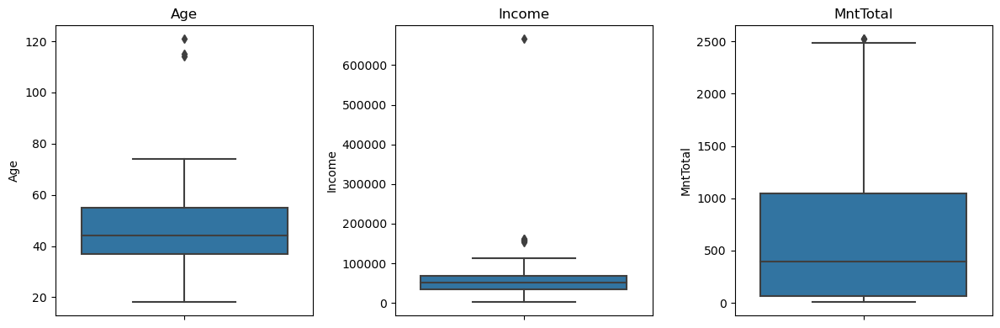

In [40]:
# visualização gráfica dos outliers das colunas 'Age', 'Income' e 'MntTotal'
search_outliers = ["Age", "Income", "MntTotal"]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), tight_layout=True)

for i, column in enumerate(search_outliers):
    sns.boxplot(y=df[column], ax=axs[i])
    axs[i].set_title(column)

# Exibindo os gráficos
plt.show()

In [41]:
df["Age"].describe()

count    2216.000000
mean       45.179603
std        11.985554
min        18.000000
25%        37.000000
50%        44.000000
75%        55.000000
max       121.000000
Name: Age, dtype: float64

In [42]:
# analisando outliers inferiores ou superiores da coluna 'Age'

df[(df["Age"] < (37 - 1.5 * (55 - 37))) | (df["Age"] > (55 + 1.5 * (55 - 37)))]

# aqui existem apenas outliers superiores

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren,AcceptedCmpTotal,HasAcceptedCmp,NumTotalPurchases
192,7829,1900,2n Cycle,Single,36640.0,1,0,2013-09-26,99,15,...,0,114,61+,65,40,1,1,0,0,5
239,11004,1893,2n Cycle,Single,60182.0,0,1,2014-05-17,23,8,...,0,121,61+,22,20,1,1,0,0,3
339,1150,1899,PhD,Partner,83532.0,0,0,2013-09-26,36,755,...,0,115,61+,1853,1629,0,0,1,1,14


In [43]:
# função auxiliar para erificação de outliers
from auxiliary_functions import inspect_outliers

inspect_outliers(df, "Age")

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren,AcceptedCmpTotal,HasAcceptedCmp,NumTotalPurchases
192,7829,1900,2n Cycle,Single,36640.0,1,0,2013-09-26,99,15,...,0,114,61+,65,40,1,1,0,0,5
239,11004,1893,2n Cycle,Single,60182.0,0,1,2014-05-17,23,8,...,0,121,61+,22,20,1,1,0,0,3
339,1150,1899,PhD,Partner,83532.0,0,0,2013-09-26,36,755,...,0,115,61+,1853,1629,0,0,1,1,14


In [44]:
# retirando os outliers da coluna 'Age'

df = df.drop(inspect_outliers(df, "Age").index)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2213 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2213 non-null   int64         
 1   Year_Birth           2213 non-null   int64         
 2   Education            2213 non-null   object        
 3   Marital_Status       2213 non-null   object        
 4   Income               2213 non-null   float64       
 5   Kidhome              2213 non-null   int64         
 6   Teenhome             2213 non-null   int64         
 7   Dt_Customer          2213 non-null   datetime64[ns]
 8   Recency              2213 non-null   int64         
 9   MntWines             2213 non-null   int64         
 10  MntFruits            2213 non-null   int64         
 11  MntMeatProducts      2213 non-null   int64         
 12  MntFishProducts      2213 non-null   int64         
 13  MntSweetProducts     2213 non-nul

In [45]:
df.Age.describe()

count    2213.000000
mean       45.082693
std        11.700216
min        18.000000
25%        37.000000
50%        44.000000
75%        55.000000
max        74.000000
Name: Age, dtype: float64

In [46]:
# verificando outliers da coluna 'Income'
inspect_outliers(df, "Income")

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren,AcceptedCmpTotal,HasAcceptedCmp,NumTotalPurchases
164,8475,1973,PhD,Partner,157243.0,0,1,2014-03-01,98,20,...,0,41,31-45,1608,1607,1,1,0,0,22
617,1503,1976,PhD,Partner,162397.0,1,1,2013-06-03,31,85,...,1,38,31-45,107,105,2,1,0,0,1
655,5555,1975,Graduation,Single,153924.0,0,0,2014-02-07,81,1,...,0,39,31-45,6,5,0,0,0,0,0
687,1501,1982,PhD,Partner,160803.0,0,0,2012-08-04,21,55,...,1,32,31-45,1717,1713,0,0,0,0,29
1300,5336,1971,Master,Partner,157733.0,1,0,2013-06-04,37,39,...,1,43,31-45,59,51,1,1,0,0,2
1653,4931,1977,Graduation,Partner,157146.0,0,0,2013-04-29,13,1,...,1,37,31-45,1730,1729,0,0,0,0,28
2132,11181,1949,PhD,Partner,156924.0,0,0,2013-08-29,85,2,...,0,65,61+,8,7,0,0,0,0,0
2233,9432,1977,Graduation,Partner,666666.0,1,0,2013-06-02,23,9,...,1,37,31-45,62,50,1,1,0,0,7


In [47]:
# retirando outliers da coluna 'Income'
df = df.drop(inspect_outliers(df, "Income").index)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2205 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2205 non-null   int64         
 1   Year_Birth           2205 non-null   int64         
 2   Education            2205 non-null   object        
 3   Marital_Status       2205 non-null   object        
 4   Income               2205 non-null   float64       
 5   Kidhome              2205 non-null   int64         
 6   Teenhome             2205 non-null   int64         
 7   Dt_Customer          2205 non-null   datetime64[ns]
 8   Recency              2205 non-null   int64         
 9   MntWines             2205 non-null   int64         
 10  MntFruits            2205 non-null   int64         
 11  MntMeatProducts      2205 non-null   int64         
 12  MntFishProducts      2205 non-null   int64         
 13  MntSweetProducts     2205 non-nul

In [48]:
df["Income"].describe()


count      2205.000000
mean      51622.094785
std       20713.063826
min        1730.000000
25%       35196.000000
50%       51287.000000
75%       68281.000000
max      113734.000000
Name: Income, dtype: float64

In [49]:
# verificando outliers da coluna 'MntTotal'

inspect_outliers(df, "MntTotal")

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren,AcceptedCmpTotal,HasAcceptedCmp,NumTotalPurchases
1179,5735,1991,Master,Single,90638.0,0,0,2014-02-13,29,1156,...,0,23,18-30,2525,2429,0,0,1,1,17
1492,1763,1988,Graduation,Partner,87679.0,0,0,2013-07-27,62,1259,...,0,26,18-30,2524,2491,0,0,3,1,28
1572,5350,1991,Master,Single,90638.0,0,0,2014-02-13,29,1156,...,0,23,18-30,2525,2429,0,0,1,1,17


In [50]:
# retirando outliers da coluna 'MntTotal'
df = df.drop(inspect_outliers(df, "MntTotal").index)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2202 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2202 non-null   int64         
 1   Year_Birth           2202 non-null   int64         
 2   Education            2202 non-null   object        
 3   Marital_Status       2202 non-null   object        
 4   Income               2202 non-null   float64       
 5   Kidhome              2202 non-null   int64         
 6   Teenhome             2202 non-null   int64         
 7   Dt_Customer          2202 non-null   datetime64[ns]
 8   Recency              2202 non-null   int64         
 9   MntWines             2202 non-null   int64         
 10  MntFruits            2202 non-null   int64         
 11  MntMeatProducts      2202 non-null   int64         
 12  MntFishProducts      2202 non-null   int64         
 13  MntSweetProducts     2202 non-nul

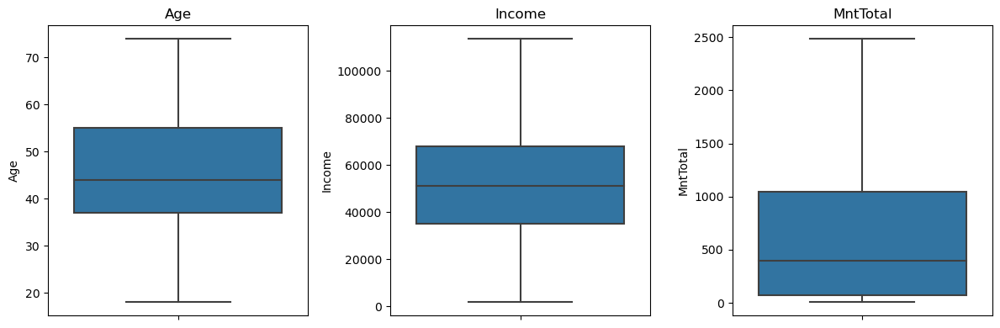

In [51]:
# visualização gráfica dos outliers das colunas 'Age', 'Income' e 'MntTotal'
search_outliers = ["Age", "Income", "MntTotal"]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), tight_layout=True)

for i, column in enumerate(search_outliers):
    sns.boxplot(y=df[column], ax=axs[i])
    axs[i].set_title(column)

# Exibindo os gráficos
plt.show()

Agora podemos observar que não há mais presença de outliers

###### Iremos retirar algumas colunas 
- 'Z_CostContact' e 'Z_Revenue' não parecem ser relevantes e não temos informações sobre o que significam
- Já aas colunas 'ID', 'Year_Birth' e 'Dt_Customer' foram divididas ou trabalhadas de maneira a facilitar o uso de algoritmos e não se fazem mais necessárias

In [52]:
df = df.drop(
    [
        'ID',
        'Year_Birth',
        'Dt_Customer',
        'Z_CostContact',
        'Z_Revenue'
        
    ], axis = 1
)


df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2202 entries, 0 to 2239
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Education            2202 non-null   object  
 1   Marital_Status       2202 non-null   object  
 2   Income               2202 non-null   float64 
 3   Kidhome              2202 non-null   int64   
 4   Teenhome             2202 non-null   int64   
 5   Recency              2202 non-null   int64   
 6   MntWines             2202 non-null   int64   
 7   MntFruits            2202 non-null   int64   
 8   MntMeatProducts      2202 non-null   int64   
 9   MntFishProducts      2202 non-null   int64   
 10  MntSweetProducts     2202 non-null   int64   
 11  MntGoldProds         2202 non-null   int64   
 12  NumDealsPurchases    2202 non-null   int64   
 13  NumWebPurchases      2202 non-null   int64   
 14  NumCatalogPurchases  2202 non-null   int64   
 15  NumStorePurchases    

In [53]:
# salvando a base com os tratamentos realizados até agora
df.to_csv('Customers_treated.csv', index=False)

In [55]:
# visualizando as características da base
with pd.option_context (
    'display.float_format','{:.2f}'.format,
    'display.max_columns', None,
):
    display(df.describe())

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,MntTotal,MntRegularProds,Children,HasChildren,AcceptedCmpTotal,HasAcceptedCmp,NumTotalPurchases
count,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00,2202.00
mean,51570.28,0.44,0.51,49.02,304.96,26.25,164.34,37.68,26.97,44.01,2.32,4.10,2.64,5.82,5.34,0.07,0.07,0.07,0.06,0.01,0.01,0.15,353.92,0.48,45.12,604.21,560.19,0.95,0.72,0.30,0.21,12.56
std,20679.44,0.54,0.54,28.94,336.14,39.59,216.31,54.82,40.93,51.75,1.89,2.74,2.79,3.24,2.41,0.26,0.26,0.26,0.24,0.12,0.09,0.36,202.59,0.50,11.69,597.90,572.10,0.75,0.45,0.68,0.40,7.18
min,1730.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,18.00,5.00,4.00,0.00,0.00,0.00,0.00,0.00
25%,35182.50,0.00,0.00,24.00,24.00,2.00,16.00,3.00,1.00,9.00,1.00,2.00,0.00,3.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,180.25,0.00,37.00,69.00,56.00,0.00,0.00,0.00,0.00,6.00
50%,51258.50,0.00,0.00,49.00,176.50,8.00,68.00,12.00,8.00,25.00,2.00,4.00,2.00,5.00,6.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,356.00,0.00,44.00,396.50,342.50,1.00,1.00,0.00,0.00,12.00
75%,68146.50,1.00,1.00,74.00,505.00,33.00,230.75,50.00,33.00,56.00,3.00,6.00,4.00,8.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,529.00,1.00,55.00,1043.75,962.00,1.00,1.00,0.00,0.00,18.00
max,113734.00,2.00,2.00,99.00,1493.00,199.00,1725.00,259.00,262.00,321.00,15.00,27.00,28.00,13.00,20.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,699.00,1.00,74.00,2486.00,2304.00,3.00,1.00,4.00,1.00,32.00


In [56]:
# visualizando as colunas categóricas
df.describe(exclude='number')

,Education,Marital_Status,AgeGroup
count,2202,2202,2202
unique,5,2,4
top,Graduation,Partner,31-45
freq,1112,1421,958


In [57]:
# escolhendo as colunas a serem analisadas
analysis =[
    'Income',
    'Recency',
    'DaysSinceEnrolled',
    'Age',
    'MntTotal',
    'HasChildren'
]

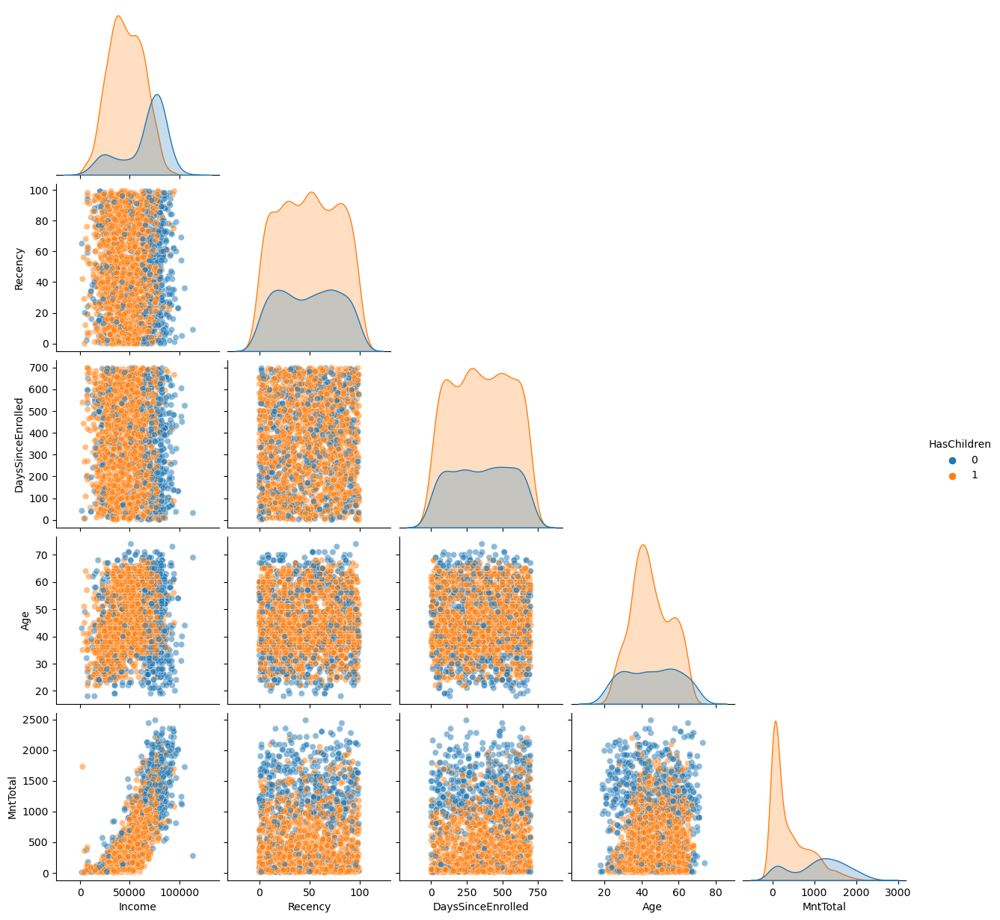

In [60]:
# realizaremos o pairplot para visualizar possíveis relações

sns.pairplot(
    df[analysis],
    diag_kind='kde',
    hue='HasChildren',
    plot_kws=dict(alpha=0.5),
    corner= True,
            )